# **Treinamento com YOLOv5**

Os dados usados são derivados do dataset público Weapon Detection - Weapons and similar handled objects - Sohas_weapon-Detection-YOLOv5 do [Andalusian Research Institute in Data Science and Computational Intelligence (DaSCI)](https://dasci.es/transferencia/open-data/24705/). Disponibilizado no repositório no github [ari-dasci
/
OD-WeaponDetection
](https://github.com/ari-dasci/OD-WeaponDetection/tree/master/Weapons%20and%20similar%20handled%20objects).


### **Etapas**:

* Clona o YOLOv5 e instala suas dependências
* Baixa dos dados personalizados para detecção de objetos no YOLOv5
* Cria a configuração de treinamento do YOLOv5 
* Instala e loga na ferramenta Weights & Biases / Wandb / W&B
* Executa o treinamento
* Avalia o desempenho
* Visualiza os dados treinados
* Realiza inferência nas imagens de teste
* Exporta pesos salvos do YOLOv5 para futuras inferências
* Varreduras/Sweeps para encontrar um conjunto de hiperparâmetros com desempenho ideal



##**Clona o YOLOv5 e instala suas dependências**

*(Ativar a GPU. No menu Ambiente de execução --> Alterar o tipo de ambiente de execução --> Acelerador de hardware --> GPU)*

In [ ]:
# Clona o repositorio do YOLOv5
%%capture
!git clone https://github.com/ultralytics/yolov5
%cd yolov5

In [ ]:
# Usa o iPython para alterar conteúdo dos arquivos
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))


In [ ]:
# Altera o requirements p não instala o torch-1.11.0 e torchvision-1.11.0 - CONFLITO

%%writetemplate /content/yolov5/requirements.txt

# YOLOv5 requirements
# Usage: pip install -r requirements.txt

# Base ----------------------------------------
matplotlib>=3.2.2
numpy>=1.18.5
opencv-python>=4.1.1
Pillow>=7.1.2
PyYAML>=5.3.1
requests>=2.23.0
scipy>=1.4.1  # Google Colab version
#torch>=1.7.0,!=1.12.0  # https://github.com/ultralytics/yolov5/issues/8395
#torchvision>=0.8.1,!=0.13.0 # https://github.com/ultralytics/yolov5/issues/8395
tqdm>=4.41.0
protobuf<4.21.3  # https://github.com/ultralytics/yolov5/issues/8012

# Logging -------------------------------------
tensorboard>=2.4.1
# wandb

# Plotting ------------------------------------
pandas>=1.1.4
seaborn>=0.11.0

# Export --------------------------------------
# coremltools>=4.1  # CoreML export
# onnx>=1.9.0  # ONNX export
# onnx-simplifier>=0.3.6  # ONNX simplifier
# nvidia-pyindex # TensorRT export
# nvidia-tensorrt # TensorRT export
# scikit-learn==0.19.2  # CoreML quantization
# tensorflow>=2.4.1  # TFLite export
# tensorflowjs>=3.9.0  # TF.js export
# openvino-dev  # OpenVINO export

# Extras --------------------------------------
ipython  # interactive notebook
psutil  # system utilization
thop>=0.1.0  # FLOPs computation
# albumentations>=1.0.3
# pycocotools>=2.0  # COCO mAP
# roboflow

In [ ]:
# Instala as dependências removidas do requirements nas versões compatíveis
!pip install torch==1.12.0+cu113 torchvision==0.13.0+cu113 torchaudio==0.12.0 --extra-index-url https://download.pytorch.org/whl/cu113

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/, https://download.pytorch.org/whl/cu113


In [ ]:
# Instala as dependêncies necessárias presentes no requirements
!pip install -qr requirements.txt

import torch
from IPython.display import Image, clear_output  # p exibir imagens
#####from utils.google_utils import gdrive_download  # CONFLITO - baixa models/datasets

#clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

     |████████████████████████████████| 596 kB 8.1 MB/s 
Setup complete. Using torch 1.12.0+cu113 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15109MB, multi_processor_count=40)


##**Baixa o dataset personalizado no formato apropriado**

Clona meu repositório ***weapon-detection-5-classes*** do github, contendo o dataset reduzido [Weapons and similar handled object detection](https://github.com/MichelleCordeiro/weapon-detection-5-classes). 

<img src="https://i.postimg.cc/BnTsTQYh/dados-reduzidos-5classes-bg.png">



In [ ]:
# Clona o repositorio que contém o dataset
!git clone https://github.com/MichelleCordeiro/weapon-detection-5-classes.git   # 4 dataset reduzido 5 classes (sem card e c bg), 911mb

Cloning into 'weapon-detection-5-classes'...
remote: Enumerating objects: 9779, done.
remote: Total 9779 (delta 0), reused 0 (delta 0), pack-reused 9779
Receiving objects: 100% (9779/9779), 904.11 MiB | 28.90 MiB/s, done.
Checking out files: 100% (9802/9802), done.


In [ ]:
# Verifica as classes
%cat /content/yolov5/weapon-detection-5-classes/obj_train_data/dataset.yaml

train: weapon-detection-5-classes/obj_train_data/images/train/
val: weapon-detection-5-classes/obj_train_data/images/test/

# number of classes
nc: 5

# class names
names: ['pistol', 'smartphone', 'knife', 'purse', 'bill']


##**Define a configuração do modelo**

No script yaml consta os parâmetros do modelo como o número de classes, âncoras e cada camada.

Os arquivos de configuração do modelo usados serão o **yolov5s.yaml** e **yolov5m.yaml** , que são modelos básicos e rápidos do YOLOv5.

<img src="https://i.postimg.cc/s2S1h0qd/model-comparison.png" width=750>

In [ ]:
# Arquivo de configuração do modelo escolhido 
%cat /content/yolov5/models/yolov5l.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 1.0  # model depth multiple
width_multiple: 1.0  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]], 

In [ ]:
# Cria modelo customizado c o número correto de classes

%%writetemplate /content/yolov5/models/custom_yolov5l.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 5  # number of classes
depth_multiple: 1.0  # model depth multiple
width_multiple: 1.0  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

## **Weights & Biases / Wandb / [W&B](https://wandb.ai/site)**
Ferramenta com diversas funcionalidades, entre elas: salvamento do treinamento em intervalos de épocas escolhido, visualização dos resultados, versionamento de dataset etc.
<img src="https://i.imgur.com/eLFrUii.png" width=750>


In [ ]:
# Instala e importa W&B

!pip install "wandb==0.12.10"   # versões superiores c conflito

import wandb
wandb.__version__

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


'0.12.10'

In [ ]:
# Loga o notebook a conta do W&B  https://wandb.ai/site
# Localização da API key https://wandb.ai/authorize

# ATENÇÃO: Se estiver demorando p concluir interrompa a
# execução dessa célula e execute novamente
# O colab se reconectará

wandb.login()

wandb: Currently logged in as: 2022-machine-learning (use `wandb login --relogin` to force relogin)


True

## **Treinamento de detecção com YOLOv5**

Argumentos:
- **img:** define o tamanho da imagem de entrada
- **batch:** determina o tamanho do lote
- **epochs:** define o número de épocas de treinamento
- **data:** defina o caminho para o arquivo yaml
- **cfg:** especifica a configuração do modelo
- **weights:** especifica o caminho personalizado para os pesos. Se vazio salvará em yolov5/weights
- **name:** nome dos resultados
- **nosave:** salva apenas o checkpoint final
- **cache:** imagens em cache para treinamento mais rápido
- **upload_dataset:** upload dos dados para controle de versão dos dados
- **bbox_interval:** ativa visualização dos dados e salva ao final de cada *bbox_interval* época as saídas do modelo no conjunto de validação
- **save_period:** ativa o controle de versão do modelo e salva ao final de cada *save_period* época

É possível acompanhar o treinamento em tempo real pelo link postado no output, em **wand: 🚀 View run at https://...**

Usando a tag **--upload_dataset**, nos próximos treinamentos é só apontar para o artefato **dataset_wandb.yaml** criado na cloud do W&B


In [ ]:
# P continuar treinamento interrompido pular p célula seguinte

# Executa treinamento vinculando checkpoints e visualização no projeto yolo5-weapon-5classes-bg na cloud da W&B
# Contabiliza o tempo ao terminar a execução

%%time
%cd /content/yolov5/

!python train.py --upload_dataset --save-period 1 --bbox_interval 1 \
  --project yolo5-weapon-5classes-bg \
  --data ./weapon-detection-5-classes/obj_train_data/dataset.yaml \
  --cfg ./models/custom_yolov5l.yaml \
  --weights ./weights/yolov5l.pt \
  --epochs 40 \
  --name yolov5l_40_results \
  --cache

/content/yolov5
wandb: Currently logged in as: 2022-machine-learning (use `wandb login --relogin` to force relogin)
train: weights=./weights/yolov5l.pt, cfg=./models/custom_yolov5l.yaml, data=./weapon-detection-5-classes/obj_train_data/dataset.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=40, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=yolo5-weapon-5classes-bg, name=yolov5l_40_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=1, seed=0, local_rank=-1, entity=None, upload_dataset=True, bbox_interval=1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-306-gfbe67e4 Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01,

### **Continuar treinamento interrompido**

<img src="https://i.postimg.cc/NMqJGsnW/w-d-blur.png" width=500>

In [ ]:
# Continua treinamento interrompido informando o path correspondente
# Contabiliza o tempo ao terminar a execução
%%time
%cd /content/yolov5/

run_path = '2022-machine-learning/yolo5-weapon-5classes-bg/1327oz60'
!python train.py --resume wandb-artifact://{run_path}

/content/yolov5
wandb: Currently logged in as: 2022-machine-learning (use `wandb login --relogin` to force relogin)
train: weights=yolov5s.pt, cfg=, data=data/coco128.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=300, batch_size=16, imgsz=640, rect=False, resume=wandb-artifact://2022-machine-learning/yolo5-weapon-5classes-bg/1327oz60, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-307-g92e47b8 Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.00

## **Avaliação da detecção dos objetos com YOLOv5**

As perdas de treinamento e as métricas de desempenho são salvas no arquivo de log (definido no treinamento na tag --name).

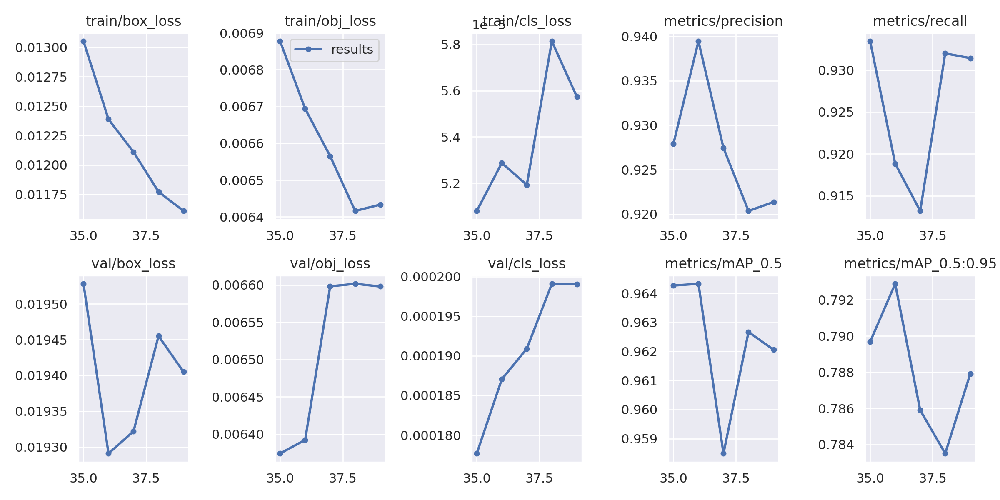

In [ ]:
# Gráficos referentes ao treinamento
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/exp/results.png', width=1000)
#Image(filename='/content/yolov5/yolo5-weapon-5classes-bg/yolov5l_40_results/results.png', width=1000)

## **Exibição dos dados treinados com as anotações**

Após o treinamento, é possível ver mosaicos de imagens de teste com as anotações e imagens de treino com as classses. Além de predições realizadas em imagens de teste.

IMAGENS DE TESTE COM AS ANOTAÇÕES


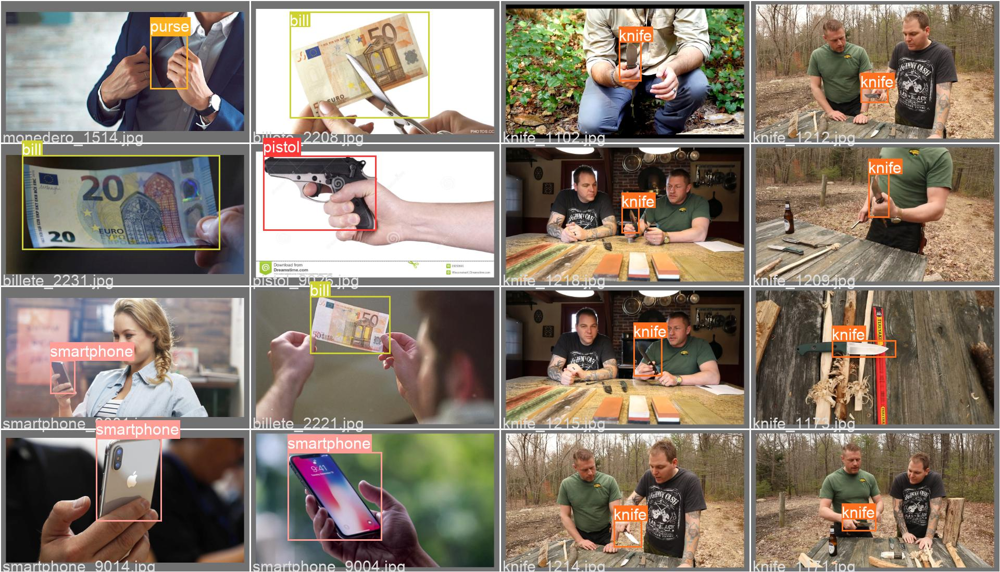

In [ ]:
print("IMAGENS DE TESTE COM AS ANOTAÇÕES")
Image(filename='/content/yolov5/runs/train/exp/val_batch0_labels.jpg', width=1200)
#Image(filename='/content/yolov5/yolo5-weapon-5classes-bg/yolov5l_40_results/val_batch0_labels.jpg', width=1200)

In [ ]:
print("IMAGENS DE TREINO COM AS CLASSES")
Image(filename='/content/yolov5/runs/train/exp/train_batch0_labels.jpg', width=1200)
#Image(filename='/content/yolov5/runs/train/yolov5m_results/train_batch0.jpg', width=1000)
#Image(filename='/content/yolov5/yolo5-weapon-5classes-bg/yolov5l_40_results/train_batch0.jpg', width=800)

IMAGENS DE TREINO COM AS CLASSES


FileNotFoundError: ignored

PREDIÇÕES EM IMAGENS DE TESTE


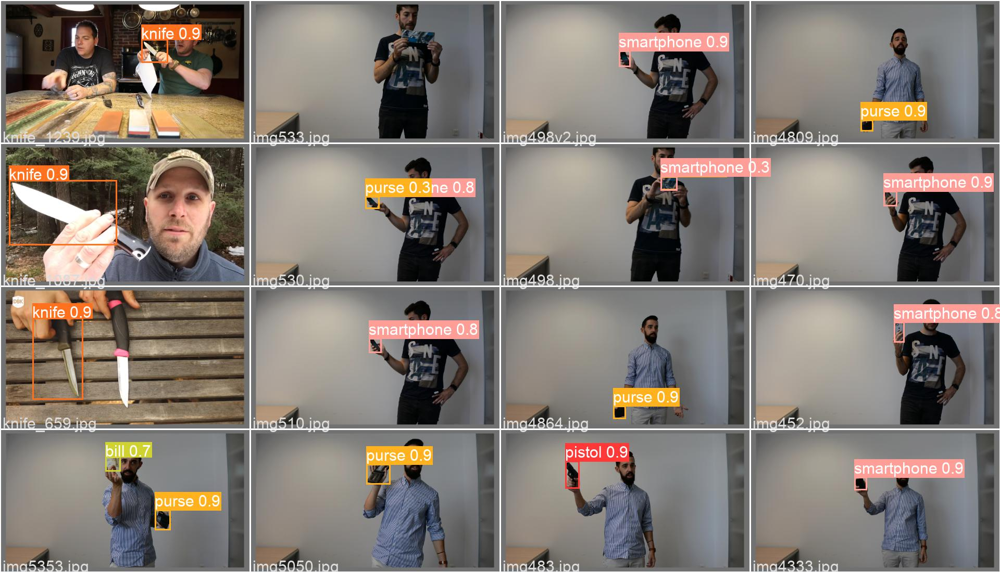

In [ ]:
print("PREDIÇÕES EM IMAGENS DE TESTE")
Image(filename='/content/yolov5/runs/train/exp/val_batch2_pred.jpg', width=1200)
#Image(filename='/content/yolov5/runs/train/exp/test_batch2_pred.jpg', width=1200)
#Image(filename='/content/yolov5/yolo5-weapon-5classes-bg/yolov5l_40_results/val_batch2_pred.jpg', width=1200)

##**Realiza inferências com o melhor peso do treinamento (best)** 

In [ ]:
# Os pesos treinados encontram-se na pasta /content/yolov5/runs/train/yolov5s_results/weights
# Os pesos treinados c W&b encontram-se na pasta //content/yolov5/yolo5-weapon-5classes-bg/yolov5s_20_results2/weights

%ls /content/yolov5/runs/train/exp/weights
#%ls /content/yolov5/yolo5-weapon-5classes-bg/yolov5l_40_results/weights

best.pt     epoch15.pt  epoch21.pt  epoch28.pt  epoch34.pt  epoch4.pt
epoch0.pt   epoch16.pt  epoch22.pt  epoch29.pt  epoch35.pt  epoch5.pt
epoch10.pt  epoch17.pt  epoch23.pt  epoch2.pt   epoch36.pt  epoch6.pt
epoch11.pt  epoch18.pt  epoch24.pt  epoch30.pt  epoch37.pt  epoch7.pt
epoch12.pt  epoch19.pt  epoch25.pt  epoch31.pt  epoch38.pt  epoch8.pt
epoch13.pt  epoch1.pt   epoch26.pt  epoch32.pt  epoch39.pt  epoch9.pt
epoch14.pt  epoch20.pt  epoch27.pt  epoch33.pt  epoch3.pt   last.pt


In [ ]:
# A inferência é executada

%cd /content/yolov5/

#!python detect.py --weights yolo5-weapon-5classes-bg/yolov5l_40_results/weights/best.pt --img 416 --conf 0.1 --source weapon-detection-5-classes/inference
#!python detect.py --weights runs/train/yolov5l_results/weights/best.pt --img 416 --conf 0.4 --source weapon-detection-5-classes/inference
!python detect.py --weights runs/train/exp/weights/best.pt --conf 0.1 --source weapon-detection-5-classes/inference

/content/yolov5
detect: weights=['runs/train/exp/weights/best.pt'], source=weapon-detection-5-classes/inference, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-307-g92e47b8 Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 444 layers, 86200330 parameters, 0 gradients, 203.8 GFLOPs
image 1/26 /content/yolov5/weapon-detection-5-classes/inference/img01.png: 352x640 Done. (0.056s)
image 2/26 /content/yolov5/weapon-detection-5-classes/inference/img02.jpg: 416x640 2 pistols, Done. (0.043s)
image 3/26 /content/yolov5/weapon-detection-5-classes/inference/img03.jpg: 416x640 1 purse, Done. (0.043s)
image 4/26 /

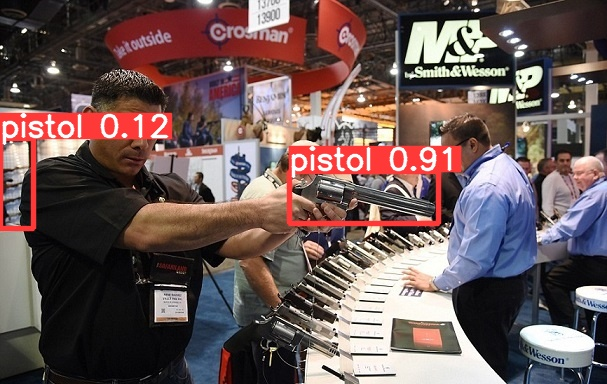

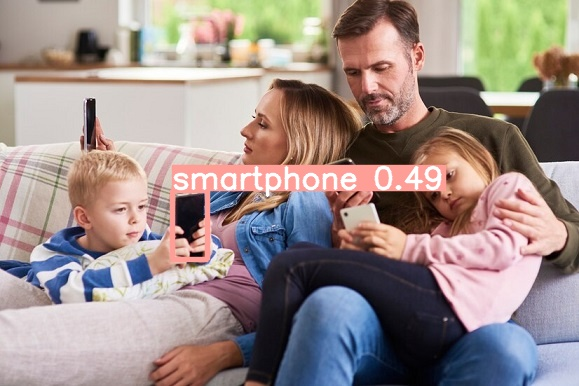

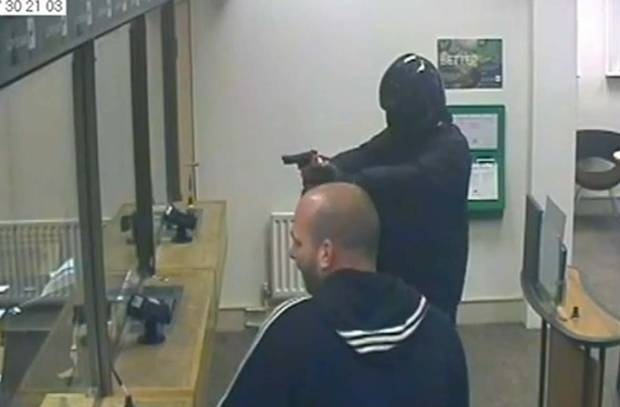

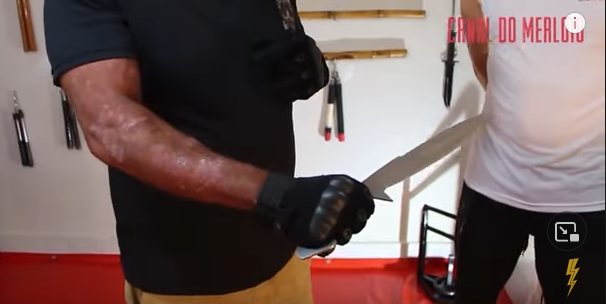

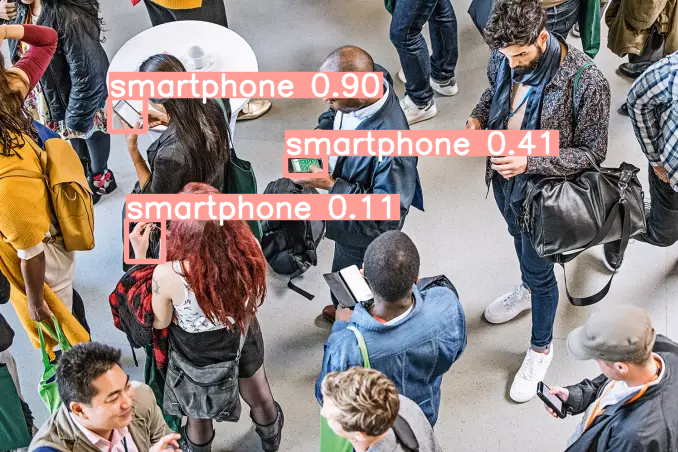

...

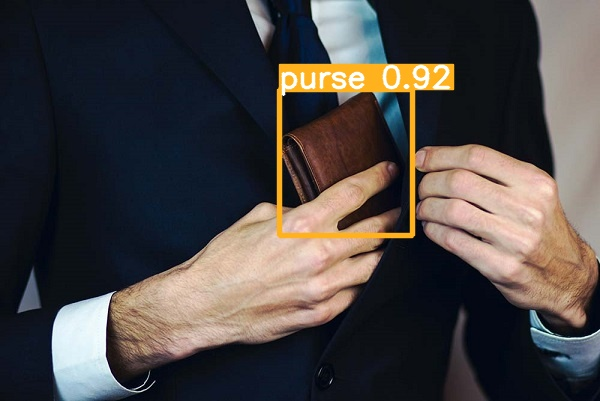

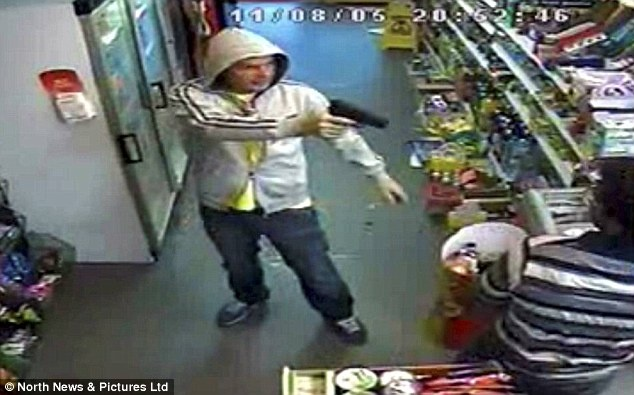

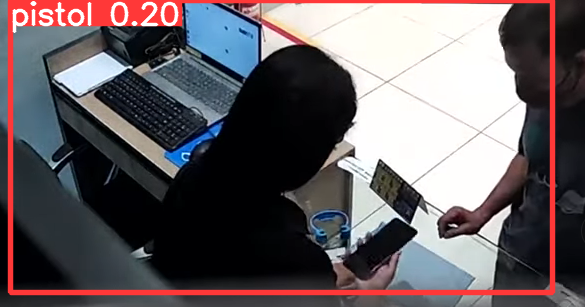

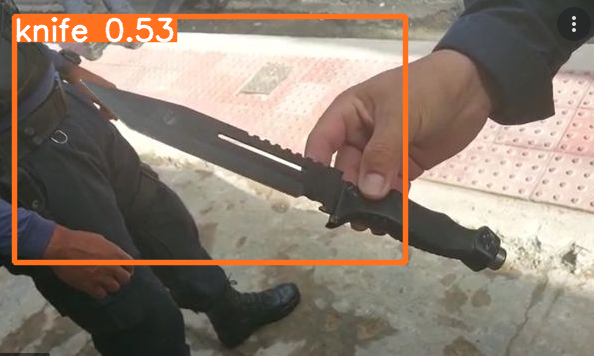

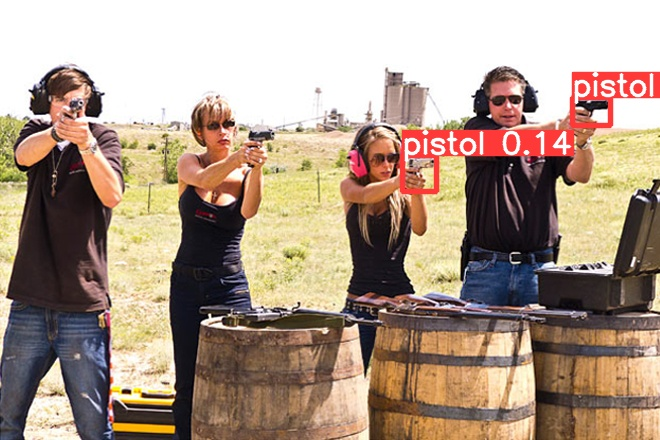

In [ ]:
# Mostra o resultado das inferências nas imagens
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp3/*.*'):
    display(Image(filename=imageName, width = 400))

MATRIZ DE CONFUSÃO


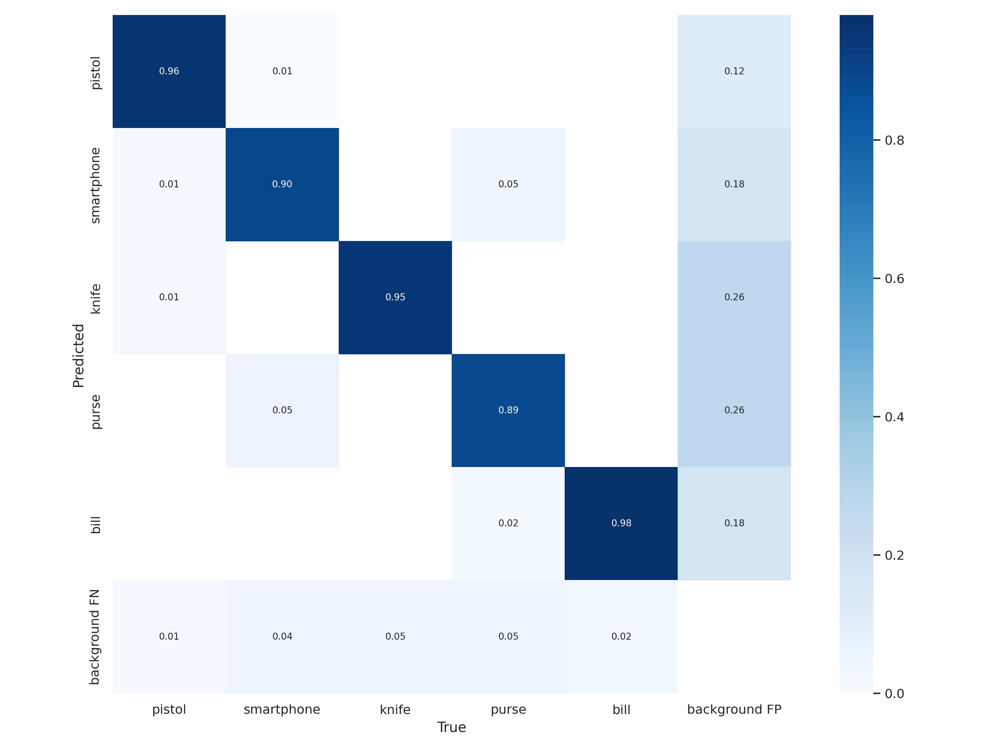

In [ ]:
print("MATRIZ DE CONFUSÃO")
#Image(filename='/content/yolov5/runs/train/yolov5m_results/confusion_matrix.png', width=1000)
Image(filename='/content/yolov5/runs/train/exp/confusion_matrix.png', width=1000)
#Image(filename='/content/yolov5/yolo5-weapon-5classes-bg/yolov5l_40_results/confusion_matrix.png', width=1000)

## **Backup dos resultados do treinamento para futuras inferências**

In [ ]:
# Monta o drive

from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!ls

artifacts	 export.py   __pycache__       setup.cfg       val.py
CONTRIBUTING.md  hubconf.py  README.md	       train.py        wandb
data		 LICENSE     requirements.txt  tutorial.ipynb
detect.py	 models      runs	       utils


In [ ]:
# Cria os diretórios

!mkdir -p /content/gdrive/MyDrive/runs/train/yolov5l_40_results
!mkdir -p /content/gdrive/MyDrive/runs/detect/yolov5l_40_results
#!mkdir -p /content/gdrive/MyDrive/runs/detect/yolov5l_40_results_conf01
#!mkdir -p /content/gdrive/MyDrive/wandb/yolov5l_40_results

In [ ]:
# Exporta os resultados do treinamento e inferências relizadas

#%cp /content/yolov5/runs/train/yolov5l_40_results/weights/best.pt /content/gdrive/MyDrive/best-weights/

%cp -r /content/yolov5/runs/train/exp/ /content/gdrive/MyDrive/runs2/train/yolov5l_40_results
#%cp -r /content/yolov5/yolo5-weapon-5classes-bg/yolov5l_40_results /content/gdrive/MyDrive/runs/train/yolov5l_40_results
%cp -r /content/yolov5/wandb/ /content/gdrive/MyDrive/wandb/yolov5l_40_results/*.*

%cp -r /content/yolov5/runs/detect/exp /content/gdrive/MyDrive/runs/detect/yolov5x_40_results

## **Sweeps** 
Realização de varreduras para otimização de hiperparâmetros e explorar modelos possíveis

**Métodos de pesquisa:**

*   **Grid**: itera toda combinação possível dos hiperparâmetros. Eficaz, porém exige muito computacionalmente
*   **Random**: seleciona as combinações aleatoriamente de acordo com as distribuições, também é eficaz e uma opção para uma análise inicial
*   **Bayes**: usa modelo probabilístico da métrica em função dos hiperparâmetros e permite escolha de parâmetros. Boa com pequeno número de parâmetros

**Atenção**: W&B precisa está instalado, importado e logado


###**Configura o Sweep e executa um agent aqui no notebook - implementação removida**

In [ ]:
# Códigos removidos, configuração da rede neural foi realizada direto na plataforma do W&B


# Define o método de pesquisa

# Obrigatório p pesquisa bayesiana 

# Definindo alguns hiperparâmetros

# Fixando a quantidade de épocas p apenas 1

# Definindo mais alguns hiperparâmetros

# Imprime o sweep_config c tudo q foi escolhido


#### **Inicializa o Sweep**

<img src="https://i.imgur.com/zlbw3vQ.png" alt="sweeps-diagram" width="400">

In [ ]:
# Retorna o sweep_id que será usado para atribuir agentes a este Controller

# sweep_id = wandb.sweep(sweep_config, project="yolo5-weapon-5classes-bg")

Create sweep with ID: wjtb7c1y
Sweep URL: https://wandb.ai/2022-machine-learning/yolo5-weapon-5classes-bg/sweeps/wjtb7c1y


#### **Define uma rede neural conectada no PyTorch**

In [ ]:
# Define uma rede neural conectada no PyTorch
# Inicializa W&B
# Salva os hiperparâmetros em wandb.config

# Define as 4 partes do treinamento c PyTorch, construindo:
# o dataset (build_dataset), a rede (build_network), o otimizador (build_optimizer)
# e as épocas do treinamento (train_epoch)

#### **Executa um agente Sweep configurado nas células anteriores**

In [ ]:
# Inicia um agente configurado nas células anteriores
# que executará o train 10 vezes, usando os valores de hiperparâmetro gerados aleatoriamente

# wandb.agent(sweep_id, train, count=10)

wandb: Agent Starting Run: xdokl5vq with config:
wandb: 	batch_size: 32
wandb: 	dropout: 0.3
wandb: 	epochs: 1
wandb: 	fc_layer_size: 256
wandb: 	learning_rate: 0.043139450906944814
wandb: 	optimizer: adam
wandb: Currently logged in as: 2022-machine-learning (use `wandb login --relogin` to force relogin)
wandb: wandb version 0.12.21 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



batch loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂
epoch,▁
loss,▁
batch loss,1.10389
epoch,0
loss,2.11724


wandb: Agent Starting Run: d4b14mpi with config:
wandb: 	batch_size: 96
wandb: 	dropout: 0.5
wandb: 	epochs: 1
wandb: 	fc_layer_size: 256
wandb: 	learning_rate: 0.0067953129644417135
wandb: 	optimizer: sgd
wandb: wandb version 0.12.21 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


batch loss,██▇▇▆▆▄▄▃▂▂▂▂▃▂▂▂▂▂▂▂▂▂▂▁▂▂▂▂▁▁▂▁▂▂▁▁▁▁▁
epoch,▁
loss,▁
batch loss,0.36673
epoch,0
loss,0.80047


wandb: Agent Starting Run: 6v65hymk with config:
wandb: 	batch_size: 136
wandb: 	dropout: 0.4
wandb: 	epochs: 1
wandb: 	fc_layer_size: 256
wandb: 	learning_rate: 0.08586269925157695
wandb: 	optimizer: adam


### **Executa um agente Sweep configurado na W&S**

In [ ]:
# Inicia um agente configurado na plataforma W&B
# YOLO e W&B instalados

!wandb agent 2022-machine-learning/yolo5-weapon-5classes-bg/49waraxl

wandb: Starting wandb agent 🕵️
2022-07-22 04:05:57,698 - wandb.wandb_agent - INFO - Running runs: []
2022-07-22 04:05:57,930 - wandb.wandb_agent - INFO - Agent received command: run
2022-07-22 04:05:57,930 - wandb.wandb_agent - INFO - Agent starting run with config:
	batch: 32
	data: weapon-detection-5-classes/obj_train_data/dataset.yaml
	epochs: 1
	imgsz: 416
	optimizer: SGD
2022-07-22 04:05:57,932 - wandb.wandb_agent - INFO - About to run command: /usr/bin/env python train.py --batch=32 --data=weapon-detection-5-classes/obj_train_data/dataset.yaml --epochs=1 --imgsz=416 --optimizer=SGD
wandb: Currently logged in as: 2022-machine-learning (use `wandb login --relogin` to force relogin)
train: weights=yolov5s.pt, cfg=, data=weapon-detection-5-classes/obj_train_data/dataset.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=1, batch_size=32, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=Fal